# Introduction

##	1) Background
The city of Sao Paulo, Sao Paulo state in Brazil, is one of the bigger world city with more of twenty millions of habitants.
The city has multiple territory division, some of which are not compatible. This incompatibility causes doubts about spatial references, for both the population and the state representatives.
For this work, it will have use of three territory divisions:
*	First level: The 32 sub prefectures.]
*	Second level: The 96 districts (each district belongs to one sub prefecture).]
*	Third level: The hundreds of neighborhoods. Unlike the sub prefectures and the districts, whose list is fixe, being administrative structures, there is no single list of neighborhood in Sao Paulo. For this work, we will consider 525 neighborhoods (the richest in information) on more than 1700 listed.


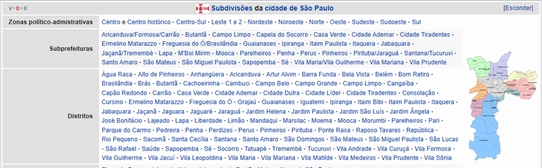

## 2) Problem
The data might help to visualize the neighborhoods with similarities about socio-economic indicators and about categories venues.

##3) Interest
The executives should have interest to visualize neighborhood distributions of the São Paulo city, economic capital of Brazil and of the South America continent, to help them to define the best locals to open new business.
The general public, interested in geography, should also be interested in this study.

# I) Recuperation of the data

## I.1) Recuperation of a list of Sao Paulo city neighborhoods, with some information about the housing market

**- Scrap of the Internet page from the Brazilian real state site "https://www.agenteimovel.com.br/imoveis/a-venda/sp/sao-paulo/ which has a table of a part of the Sao Paulo city neighborhoods**

In [1]:
import pandas as pd
import numpy as np

URL="https://www.agenteimovel.com.br/imoveis/a-venda/sp/sao-paulo/"
scrap = pd.read_html(URL, match='Bairro') #Filter the table with Bairro in the header
scrap[0]
print('Data downloaded with {0} neighborhoods'.format(scrap[0].shape[0]))

Data downloaded with 300 neighborhoods


**OBSERVATION:**


> There is much more neighborhood in Sao Paulo city (the site page "https://www.tudoaquisaopaulo.com.br/bairros/sao-paulo-sp" references more of 1700 neighborhood), but like they are with few informations (the majority of these others neighborhoodare communities of the periphery), they will not be considered by this study.



In [0]:
#Scrap of the site to have the total number of neighborhoodin Sao Paulo city
URL='https://www.tudoaquisaopaulo.com.br/bairros/sao-paulo-sp'
#Importation of the library used to import pages of the website.
import urllib3
#Importation of the library module used to parse the data of this website
from bs4 import BeautifulSoup
#Importation of the website
http = urllib3.PoolManager()
response = http.request('GET', URL)
soup = BeautifulSoup(response.data)
#print(soup.prettify)
lista=[]
#Finding of all the references to neighborhood
all_links=soup.find_all("a")
for link in all_links:
    href=link.get("href")
    #Input of the name of the neighborhoodin the neighborhoodlist
    if str(type(href)) != "<class 'NoneType'>": 
        if href.startswith("/sao-paulo-sp/"):
            lista.append(href[14:])

print('Total of neighborhoodin Sao Paulo city: {0}'.format(len(lista)))
pd.DataFrame(lista[:][14:], columns=['Neighborhood'])

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Total of neighborhoodin Sao Paulo city: 1739


,Neighborhood
0,artur-alvim
1,associacao-sobradinho
2,balneario-dom-carlos
3,balneario-mar-paulista
4,balneario-sao-francisco
...,...
1720,vila-zat
1721,vila-zefira
1722,vila-zelina
1723,vila-zilda


**- Formation of the neighborhood Data Frame**

In [0]:
#Renaming of the columns
dfNbh = scrap[0]
dfNbh=dfNbh.rename(columns={'Bairro':'Neighborhood', 'Alteração Mensal': 'RateMonth', 'Preço/M²':'PriceByM2', 
                            'Preço médio':'MedianPrice'})
print(dfNbh.columns)

#Replace empty string by np.nan to have True with the Pandas function isnull
dfNbh = dfNbh.replace('', np.nan)

dfNbh=dfNbh[(~dfNbh.Neighborhood.isnull())]
dfNbh.reset_index(drop=True, inplace=True)
dfNbh

Index(['Neighborhood', 'RateMonth', 'PriceByM2', 'MedianPrice'], dtype='object')


,Neighborhood,RateMonth,PriceByM2,MedianPrice
0,Jardim Europa,+0.65%,R$ 19.092,R$ 7.272.589
1,Jardim Paulistano,+1.00%,R$ 18.521,R$ 6.833.992
2,Vila Nova Conceição,+0.80%,R$ 18.332,R$ 4.170.090
3,Chácara Itaim,-2.29%,R$ 18.054,R$ 6.979.825
4,Jardim América,+0.79%,R$ 17.119,R$ 7.731.490
...,...,...,...,...
295,Jardim Rosa Maria,-0.35%,R$ 4.302,R$ 610.221
296,Jardim Santa Helena,-3.25%,R$ 4.173,R$ 1.915.566
297,Parque Ipê,-0.13%,R$ 3.861,R$ 413.106
298,Jardim Patente,-0.93%,R$ 3.805,R$ 372.001


**-Recuperation of the  latitude & longitude coordenates of each neighborough, calling the provider Arcgis with the geocoder library and saving these in a Json file of the personal Google Drive or loading these of the Json file if it exists**

In [0]:
!pip install geocoder

     |████████████████████████████████| 102kB 3.8MB/s 


In [0]:
import geocoder # import geocoder
try:
  dfNbh = pd.read_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/dfNbh.json")
except:
  # initialization of the list which will conserve the coordenates of each neighborhood of Sao Paulo
  coordLatLng_lst = []
  for ind in dfNbh.iloc[0:].index:
    nbh=dfNbh.loc[ind, "Neighborhood"]
    #br=dfNbh.loc[ind, "Borough"]
    # initialization
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        #g = geocoder.google('{}, Toronto, Ontario'.format(postalCode))
        #g = geocoder.arcgis('{}, {}, Sao Paulo, Sao Paulo'.format(nbh, br))
        g = geocoder.arcgis('{}, Sao Paulo, Sao Paulo'.format(nbh))
        lat_lng_coords = g.latlng
        
    coordLatLng_lst.append(lat_lng_coords)
    #print("index {} - Coordenates of the  {}-{}: {}".format(ind, br, nbh, lat_lng_coords))
    print("index {} - Coordenates of the  {}: {}".format(ind, nbh, lat_lng_coords))

  dfNbh["Latitude"] = np.array(coordLatLng_lst)[:, 0]
  dfNbh["Longitude"] = np.array(coordLatLng_lst)[:, 1]
  #Observation: The list is passed as array because the slicing in nested list is not working
  #             to recover the individual latitude ans longitude of each postal code coordenates.

  dfNbh.to_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/dfNbh.json")

#Consultation of the first and last rows of the neighborhooddata frame with the latitude and longitude coordenates}
dfNbh

,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude
0,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416
1,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881
2,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685
3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246
4,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180
...,...,...,...,...,...,...
520,Parque Savoy City,-1.13%,R$ 3.540,R$ 417.503,-23.56462,-46.48631
521,Parque Casa de Pedra,+0.06%,R$ 3.531,R$ 454.416,-23.45212,-46.60123
522,Conjunto Residencial José Bonifácio,+0.18%,R$ 3.287,R$ 192.838,-23.54756,-46.43445
523,Cidade São Mateus,-1.04%,R$ 3.180,R$ 360.973,-23.60128,-46.47860


##I.2) Recuperation of the administratives limits of the Sao Paulo city (the 96 sub-prefectures and the 32 districts)

**- Downloading shape files from a Sao Paulo city oficial site http://geosampa.prefeitura.sp.gov.br/PaginasPublicas/_SBC.aspx and uploading these file in a personal Google Drive**

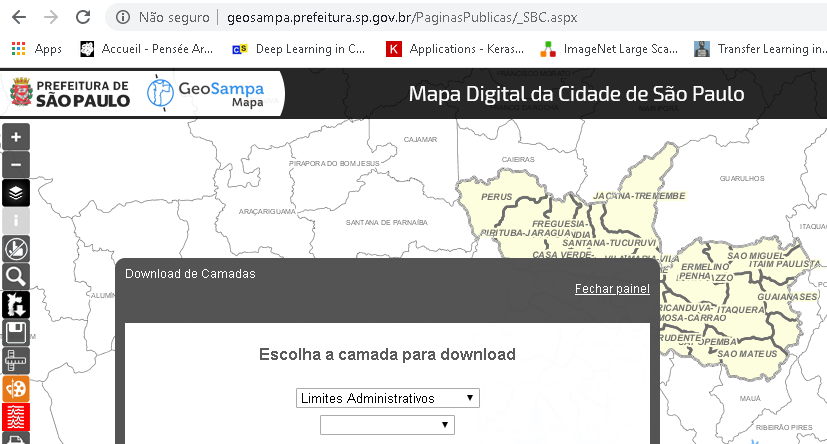

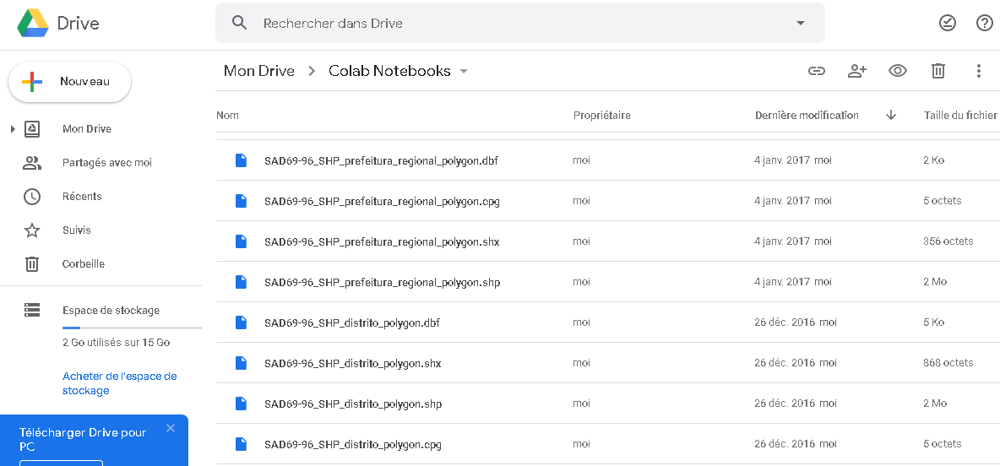

In [0]:
#Importation of the libraries to read the shape file with the administrative limits
!pip install pyshp #Modulo shapefile
!pip install geopandas

import geopandas
from geopandas import GeoSeries
from shapely.geometry import Polygon
import shapefile
import json
from json import dumps

     |████████████████████████████████| 225kB 5.1MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32609 sha256=41c08a3620cc350f1af40909076fca59b986c44a08ac9bfe7828b962f08e3d0d
  Stored in directory: /root/.cache/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built pyshp
     |████████████████████████████████| 931kB 5.1MB/s 
     |████████████████████████████████| 14.7MB 303kB/s 
     |████████████████████████████████| 10.9MB 42.4MB/s 


**- Creation of a function to pass the data of shape file to a Json file (format recognized by the folium library used afterward to create the map of Sao Paulo city with his administrative limits)**

In [0]:
def shapeToJson(raizArquivo):
  fileShape="/content/drive/My Drive/Colab Notebooks/"+raizArquivo+".shp"
  fileGeoJson="/content/drive/My Drive/Colab Notebooks/"+raizArquivo+".json"
  # read the shapefile
  reader = shapefile.Reader(fileShape)
  fields = reader.fields[1:]
  field_names = [field[0] for field in fields]
  buffer = []
  for sr in reader.shapeRecords():
    atr = dict(zip(field_names, sr.record))
    geom = sr.shape.__geo_interface__
    buffer.append(dict(type="Feature", \
                       geometry=geom, properties=atr)) 

    # write the GeoJSON file
    geojson = open(fileGeoJson, "w")
    geojson.write(dumps({"type": "FeatureCollection", "features": buffer}, indent=2) + "\n")
    geojson.close()


**- Transformation of the shape files to Json files**

In [0]:
# - Name root of the spape files with administrative limits of the sub-prefectures
raizArquivo="SAD69-96_SHP_prefeitura_regional_polygon"
# Call of the function to pass the data from the Shape file to the Json file
shapeToJson(raizArquivo)

# - Name root of the spape files with administrative limits of the districts
raizArquivo="SAD69-96_SHP_distrito_polygon"
# Call of the function to pass the data from the Shape file to the Json file
shapeToJson(raizArquivo)

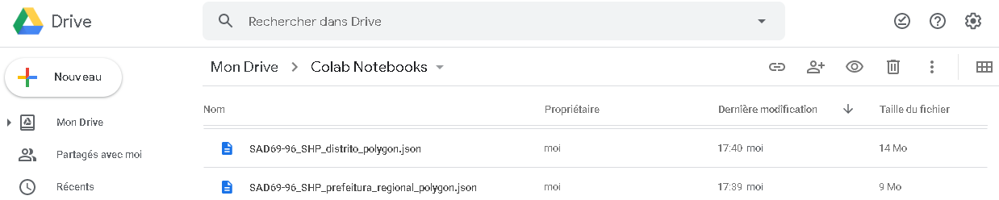

**-Creation of a function to convert the administrative limits from UTM Cartesian coordinate system (X/Y coordinates in meters), EPSG:29193 for Sao PAulo, to WGS84 spherical coordinate system (latitude/longitude degrees), EPSG:4326 for Sao Paulo**  

In [0]:
def geoJsonPandas(raizArquivo):
  fileGeoJson="/content/drive/My Drive/Colab Notebooks/"+raizArquivo+".json"
  geoPandas = geopandas.read_file(fileGeoJson)
  geoPandas.crs = "EPSG:29193" #UTM EPSG:2955 3395
  geoPandas=geoPandas.to_crs({'init': 'epsg:4326'}) #WGS84: "EPSG:4326"
  geoJson=geoPandas.to_json()
  return geoJson, geoPandas

**-Creation of GeoJson e GeoPandas structures with the latitude&longitude coordinates of the Sao Paulo sub-prefectures and of the  Sao Paulo districts**

In [0]:
#Se conserva em uma estrutura GeoPandas e GeoJon do conteudo dos arquivos gerados encima, transformando as coordenadas das limites
#da norma EPSG:29193 que estava no arquivo shapefile de origem (coordenadas planas) na norma epsg:4326
# - Dos distritos
raizArquivo="SAD69-96_SHP_distrito_polygon"
jsDistrit, gpDistrit = geoJsonPandas(raizArquivo)
print('There is {0} districts.'.format(gpDistrit.shape[0]))
print(gpDistrit.head())

# - Das sub-prefeituras
raizArquivo="SAD69-96_SHP_prefeitura_regional_polygon"
jsSubPref, gpSubPref = geoJsonPandas(raizArquivo)
print('There is {0} subprefectures.'.format(gpSubPref.shape[0]))
gpSubPref.head()


/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


There is 96 districts.
  ds_codigo          ds_nome                                           geometry
0        51         MANDAQUI  POLYGON ((-46.65469 -23.43064, -46.65468 -23.4...
1        52         MARSILAC  POLYGON ((-46.60987 -23.90551, -46.60989 -23.9...
2        32            MOEMA  POLYGON ((-46.65360 -23.57220, -46.65358 -23.5...
3        57  PARQUE DO CARMO  POLYGON ((-46.44460 -23.59273, -46.44470 -23.5...
4        60         PERDIZES  POLYGON ((-46.66355 -23.53692, -46.66361 -23.5...


/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


There is 32 subprefectures.


,sp_codigo,sp_nome,geometry
0,02,PIRITUBA-JARAGUA,"POLYGON ((-46.77040 -23.47841, -46.77040 -23.4..."
1,03,FREGUESIA-BRASILANDIA,"POLYGON ((-46.68975 -23.50904, -46.68995 -23.5..."
2,04,CASA VERDE-CACHOEIRINHA,"POLYGON ((-46.67362 -23.48004, -46.67359 -23.4..."
3,05,SANTANA-TUCURUVI,"POLYGON ((-46.62430 -23.51942, -46.62509 -23.5..."
4,06,JACANA-TREMEMBE,"POLYGON ((-46.56112 -23.48727, -46.56148 -23.4..."


##I.3) Determination of the subprefecture and of the district of each neighborhood present in the data frame dfNbh

**OBSERVATION:**
> Like it hasn't been found a web site with the indications, easy to recover, of the subprefecture and districts of the Sao Paulo city neigboroughs, it has been used a geometric aproach: for each neighborhoodloop on all the subprefectures and all districts to find these whose the polygon containts the neighborhoodcentral point.

**- To verify this geometric aproach, we apply it on the "Vila Uberabinha" neighborhoodwhich is part of the "MOEMA" district and of the "VILA MARIANA" subprefecture**

<class 'geopandas.geoseries.GeoSeries'>
<class 'geopandas.geoseries.GeoSeries'>
   sp_codigo       sp_nome                                           geometry
19        12  VILA MARIANA  POLYGON ((-46.66175 -23.61726, -46.66187 -23.6...
  ds_codigo ds_nome                                           geometry
2        32   MOEMA  POLYGON ((-46.65360 -23.57220, -46.65358 -23.5...
       Neighborhood RateMonth  PriceByM2   MedianPrice  Latitude  Longitude
11  Vila Uberabinha    +0.37%  R$ 13.059  R$ 2.388.741 -23.60078  -46.67094
Vila Uberabinha is in the district of MOEMA? 2    True
dtype: bool
Vila Uberabinha is in the subprefecture of VILA MARIANA? 19    True
dtype: bool


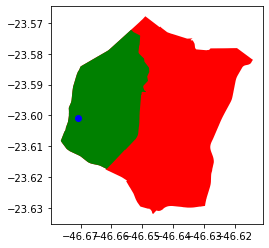

In [0]:
print(type(gpSubPref.geometry))
print(type(gpDistrit.geometry))
print(gpSubPref[gpSubPref.sp_nome=='VILA MARIANA'])
print(gpDistrit[gpDistrit.ds_nome=='MOEMA'])
print(dfNbh[dfNbh.Neighborhood == 'Vila Uberabinha'])

from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

#Creation of one geometric point with the longitude and latitude of the center of Vila Uberabinha
nbhVilaUberabinha=Point(dfNbh[dfNbh.Neighborhood == 'Vila Uberabinha'].Longitude, dfNbh[dfNbh.Neighborhood == 'Vila Uberabinha'].Latitude)
#Recuperation of the polygon with the limits of the MOEMA district
distritVilaUberabinha=gpDistrit[gpDistrit.ds_nome=='MOEMA'].geometry
#Recuperation of the polygon with the limits of the VILA MARIANA subprefecture
subPrefVilaUberabinha=gpSubPref[gpSubPref.sp_nome=='VILA MARIANA'].geometry

#Plot of the subprefecture polygon in red
ax=subPrefVilaUberabinha.plot(color='red')
#Plot, in the same axis, of the district polygon in green (subdivision of the subprefecture)
distritVilaUberabinha.plot(color='green', ax=ax)
#Plot, in the same axis, of the neighborhood point in blue
pontoVilaUberabinha = GeoSeries(nbhVilaUberabinha)
pontoVilaUberabinha.plot(color='blue', ax=ax)

#Verification that the neighborhoodpoint is present in the district and subprefecture polygons
print("Vila Uberabinha is in the district of MOEMA? {0}".format(distritVilaUberabinha.contains(nbhVilaUberabinha)))
print("Vila Uberabinha is in the subprefecture of VILA MARIANA? {0}".format(subPrefVilaUberabinha.contains(nbhVilaUberabinha)))

**- Loop on each neighborhood to find his subprefecture and his district, applying the geometric test**

In [0]:
for lg, lt, idx, nome in zip(dfNbh.Longitude, dfNbh.Latitude, dfNbh.index, dfNbh.Neighborhood):
  print('[Index {0}] Para o bairro {1}'.format(idx, nome))
  ptBairro = Point(lg, lt)
  for polygon, nome2 in zip(gpSubPref.geometry, gpSubPref.sp_nome):
    if (polygon.contains(ptBairro)):
      dfNbh.loc[idx, 'Subprefecture'] = nome2
      print('-> A subprefeitura esta {0}'.format(nome2))
  for polygon, nome2 in zip(gpDistrit.geometry, gpDistrit.ds_nome):
    if (polygon.contains(ptBairro)):
      dfNbh.loc[idx, 'District'] = nome2
      print('-> O distrito esta {0}'.format(nome2))

#polygon=gpSubPref[gpSubPref.sp_nome=='VILA MARIANA'].geometry
#point=Point(dfNbh[dfNbh.Neighborhood == 'Moema'].Longitude, dfNbh[dfNbh.Neighborhood == 'Moema'].Latitude)
#polygon.contains(point)

[Index 0] Para o bairro Jardim Europa
-> A subprefeitura esta PINHEIROS
-> O distrito esta PINHEIROS
[Index 1] Para o bairro Chácara Itaim
-> A subprefeitura esta PINHEIROS
-> O distrito esta ITAIM BIBI
[Index 2] Para o bairro Jardim Paulistano
-> A subprefeitura esta PINHEIROS
-> O distrito esta PINHEIROS
[Index 3] Para o bairro Vila Nova Conceição
-> A subprefeitura esta VILA MARIANA
-> O distrito esta MOEMA
[Index 4] Para o bairro Jardim América
-> A subprefeitura esta PINHEIROS
-> O distrito esta JARDIM PAULISTA
[Index 5] Para o bairro Jardim Luzitânia
-> A subprefeitura esta VILA MARIANA
-> O distrito esta MOEMA
[Index 6] Para o bairro Itaim Bibi
-> A subprefeitura esta PINHEIROS
-> O distrito esta ITAIM BIBI
[Index 7] Para o bairro Jardim Panorama
-> A subprefeitura esta BUTANTA
-> O distrito esta MORUMBI
[Index 8] Para o bairro Vila Olímpia
-> A subprefeitura esta PINHEIROS
-> O distrito esta ITAIM BIBI
[Index 9] Para o bairro Cerqueira César
-> A subprefeitura esta PINHEIROS
->

**- Content of the neighborougn data frame with the aditional informations about their subprefecture and district**

In [0]:
dfNbh

,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District
0,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416,PINHEIROS,PINHEIROS
1,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881,PINHEIROS,ITAIM BIBI
2,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685,PINHEIROS,PINHEIROS
3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246,VILA MARIANA,MOEMA
4,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180,PINHEIROS,JARDIM PAULISTA
...,...,...,...,...,...,...,...,...
520,Parque Savoy City,-1.13%,R$ 3.540,R$ 417.503,-23.56462,-46.48631,ITAQUERA,CIDADE LIDER
521,Parque Casa de Pedra,+0.06%,R$ 3.531,R$ 454.416,-23.45212,-46.60123,JACANA-TREMEMBE,TREMEMBE
522,Conjunto Residencial José Bonifácio,+0.18%,R$ 3.287,R$ 192.838,-23.54756,-46.43445,ITAQUERA,JOSE BONIFACIO
523,Cidade São Mateus,-1.04%,R$ 3.180,R$ 360.973,-23.60128,-46.47860,SAO MATEUS,SAO MATEUS


##I.4) Recuperation of the IDH (Index of Development Human) of the Sao Paulo city districts

**- Scrap of the Brazilian wiki page https://pt.wikipedia.org/wiki/Lista_dos_distritos_de_S%C3%A3o_Paulo_por_%C3%8Dndice_de_Desenvolvimento_Humano**

In [0]:
URL="https://pt.wikipedia.org/wiki/Lista_dos_distritos_de_S%C3%A3o_Paulo_por_%C3%8Dndice_de_Desenvolvimento_Humano"
scrap = pd.read_html(URL, match='Distrito') #Filter the table with Ditrito in the header
print('Data downloaded!')
dfIdh = pd.concat([scrap[0], scrap[3], scrap[6]], axis=0)
dfIdh.columns
dfIdh = dfIdh.drop(columns=[0, 3])
dfIdh = dfIdh.rename(columns={1:'District', 2: 'Idh'})
#Replace empty string by np.nan to have True with the Pandas function isnull
dfIdh = dfIdh.replace('', np.nan)
dfIdh=dfIdh[(dfIdh.Idh != 'Dados de 2012') & (dfIdh.Idh != 'Dados de 2000') & (dfIdh.Idh != 'IDH') & (~dfIdh.Idh.isnull())]
dfIdh.reset_index(drop=True, inplace=True)
dfIdh.Idh = dfIdh.Idh.astype(float)/1000
dfIdh.District = dfIdh.District.str.upper()
dfIdh

Data downloaded!


,District,Idh
0,MOEMA,0.961
1,PINHEIROS,0.960
2,PERDIZES,0.957
3,JARDIM PAULISTA,0.957
4,ALTO DE PINHEIROS,0.955
...,...,...
91,IGUATEMI,0.751
92,JARDIM ÂNGELA,0.750
93,LAJEADO,0.748
94,PARELHEIROS,0.747


**Merge, by the district column, of the IDH information in the data frame neighborhood**

In [0]:
dfNbh = pd.merge(dfNbh, dfIdh, how = 'left', on = ['District'])
dfNbh

,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh
0,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416,PINHEIROS,PINHEIROS,0.960
1,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881,PINHEIROS,ITAIM BIBI,0.953
2,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685,PINHEIROS,PINHEIROS,0.960
3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246,VILA MARIANA,MOEMA,0.961
4,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180,PINHEIROS,JARDIM PAULISTA,0.957
...,...,...,...,...,...,...,...,...,...
520,Parque Savoy City,-1.13%,R$ 3.540,R$ 417.503,-23.56462,-46.48631,ITAQUERA,CIDADE LIDER,NaN
521,Parque Casa de Pedra,+0.06%,R$ 3.531,R$ 454.416,-23.45212,-46.60123,JACANA-TREMEMBE,TREMEMBE,NaN
522,Conjunto Residencial José Bonifácio,+0.18%,R$ 3.287,R$ 192.838,-23.54756,-46.43445,ITAQUERA,JOSE BONIFACIO,NaN
523,Cidade São Mateus,-1.04%,R$ 3.180,R$ 360.973,-23.60128,-46.47860,SAO MATEUS,SAO MATEUS,NaN


**- Total of neighborhood with/without the IDH informatio**

In [0]:
print('Total of neighborhoodWITH IDH information: {0}'.format((~dfNbh.Idh.isnull()).sum()))
print('Total of neighborhoodWITHOUT IDH information: {0}'.format((dfNbh.Idh.isnull()).sum()))

Total of neighborhoodWITH IDH information: 335
Total of neighborhoodWITHOUT IDH information: 190


# II) Exploratory of the data

## II.1) Map of Sao Paulo city with the administrative limits of the 32 sub prefectures and of the 96 districts and the indication of the center of each 525 neighborhood studied

**- Creation of a map focused on Sao Paulo city adding a GeoJson with the administrative limits of the 32 sub prefectures (black line) and a GeoJson of the 96 districts (blue lines), showing as label the name of the district passing the cursor mouse on the zone of the district**

In [0]:
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import folium # map rendering library

address = 'Sao Paulo, Sao Paulo'
geolocator = Nominatim(user_agent="tr_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Sao Paulo City are {}, {}.'.format(latitude, longitude))
# create map of New York using latitude and longitude values
# create map of New York using latitude and longitude values
mapSaoPaulo = folium.Map(location=[latitude, longitude], zoom_start=12.3)

import random
def random_html_color():
    r = random.randint(0,256)
    g = random.randint(0,256)
    b = random.randint(0,256)
    return '#%02x%02x%02x' % (r, g, b)
def style_fcn2(x):
    return { 'fillColor': random_html_color() }
def style_fcn(x):
    return { 'color':'black', 'fill':False, 'fill_color':'white', 'fill_opacity':0.0 }

style2 = "font-size: 15px; font-weight: bold"
folium.GeoJson(jsDistrit, style_function=style_fcn2, 
               tooltip=folium.features.GeoJsonTooltip(['ds_nome'], style=style2, labels=False)
               ).add_to(mapSaoPaulo)
folium.GeoJson(jsSubPref, style_function=style_fcn,
               #tooltip=folium.features.GeoJsonTooltip(['sp_nome'], style=style2, labels=False)
               ).add_to(mapSaoPaulo)
'''folium.GeoJson(geo_json_data3, style_function=style_fcn2, 
               tooltip=folium.features.GeoJsonTooltip(['setor_cens'], style=style2, labels=False)
               ).add_to(mapSaoPaulo)'''

The geograpical coordinate of Sao Paulo City are -23.5506507, -46.6333824.


"folium.GeoJson(geo_json_data3, style_function=style_fcn2, \n               tooltip=folium.features.GeoJsonTooltip(['setor_cens'], style=style2, labels=False)\n               ).add_to(mapSaoPaulo)"

**- Adition in the Sao Paulo city map, of the neighborhood as markers in blue, using as popup, clicking on the marker, the neighborhood/sub prefecture and district names and the latitude/longitude (the Vila Uberabinha neigborhood marker, used to verify the geometric method to find the district and sub-prefecture of each neighborhood, is ploted with the green color)**

In [0]:
# add markers to map
#for lat, lng, borough, neighborhood in zip(dfNbh['Latitude'], dfNbh['Longitude'], dfNbh['Borough'], dfNbh['Neighborhood']):
for lat, lng, neighborhood, district, subprefecture in zip(dfNbh['Latitude'], dfNbh['Longitude'], dfNbh['Neighborhood'], dfNbh['District'], dfNbh['Subprefecture']):
#    label = '{} of {}'.format(neighborhood, borough)
  label = '{} {}/{} {}-{}'.format(neighborhood, district, subprefecture, lat, lng)
  label = folium.Popup(label, parse_html=True)
  if neighborhood=='Vila Uberabinha':
    coloracao = 'green'
  else:
    coloracao = 'blue'
  folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=coloracao,
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(mapSaoPaulo) 

**- Consultation of the Sao Paulo city with the sub prefecture and district limits and the center of each neighborhood**

In [0]:
mapSaoPaulo

## II.2) The principal venue categories of each neighborhood

**- Crententials to use the Foursquare API**

In [0]:
### Define Foursquare Credentials and Version
CLIENT_ID = 'XXXX' # your Foursquare ID
CLIENT_SECRET = 'XXXX' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
TOKEN_ID= 'XXXX'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)
print('TOKEN_ID:' + TOKEN_ID)

Your credentails:
CLIENT_ID: CWKC3PFATDOC3LCRJNRYDN0MP1CQZ2GFH4G3IOGXBJQAKYAM
CLIENT_SECRET:B4UGRGMPR31MOSHETPXYTYYOVDQWITRHGVOG2BFHXIR10YIG
TOKEN_ID:GSRLYVEVIIAS5EW4DMMATHDFJ0WCDPPKME2LNJ3M5X2KVPYE


**- Function to call the Foursquare API to recover until 200 venues around 1000 meters of each neighborhood center**

In [0]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    LIMIT = 200 # limit of number of venues returned by Foursquare API
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
          jsonResult = requests.get(url).json()
          results = jsonResult["response"]['groups'][0]['items']

          # return only relevant information for each nearby venue
          venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
        except Exception as inst:
          print(jsonResult)
          print(type(inst))    # the exception instance
          print(inst.args)     # arguments stored in .args
          print(inst)          # __str__ allows args to be printed directly,
                          # but may be overridden in exception subclasses
          x = inst.args     # unpack args
          print('x =', x)
          #print('y =', y)

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

**- Information of the data frame venuesSaoPaulo with the venues of each neighborhood already readed and saved in a Json file or calling the API Foursquare by the finction getNearbyVenues**

In [0]:
try:
  #Recuperation of the venues from the Json file if it exists
  venuesSaoPaulo = pd.read_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/venuesSaoPaulo.json")
except:
  #Recuperation of the venues calling the Foursquare API because the result of the API has not already been saved in a Json file
  venuesSaoPaulo = getNearbyVenues(names=dfNbh['Neighborhood'],
                                   latitudes=dfNbh['Latitude'],
                                   longitudes=dfNbh['Longitude']
                                  )
  #Saving of the Foursquare API results in a Json file 
  venuesSaoPaulo.to_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/venuesSaoPaulo.json")

print(venuesSaoPaulo.shape) #Size of the results
print(venuesSaoPaulo.groupby('Neighborhood').count()) #Count of venus by neighborhood

(34281, 7)
                   Neighborhood Latitude  ...  Venue Category
Neighborhood                              ...                
Aclimação                            100  ...             100
Alto da Boa Vista                     13  ...              13
Alto da Lapa                          38  ...              38
Alto da Mooca                        100  ...             100
Alto de Pinheiros                     43  ...              43
...                                  ...  ...             ...
Várzea de Baixo                       86  ...              86
Água Branca                           87  ...              87
Água Fria                            100  ...             100
Água Funda                            49  ...              49
Água Rasa                            100  ...             100

[523 rows x 6 columns]


**- Exemple of venues of the neighborhood Vila Uberabinha**

In [0]:
venuesSaoPaulo[venuesSaoPaulo.Neighborhood=='Vila Uberabinha']

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1100,Vila Uberabinha,-23.60078,-46.67094,Atrium Saúde,-23.601070,-46.671485,Health & Beauty Service
1101,Vila Uberabinha,-23.60078,-46.67094,Bráz Pizzaria,-23.599948,-46.672866,Pizza Place
1102,Vila Uberabinha,-23.60078,-46.67094,Museo Veronica,-23.600247,-46.669106,Spanish Restaurant
1103,Vila Uberabinha,-23.60078,-46.67094,Câmara Fria,-23.600048,-46.672806,Speakeasy
1104,Vila Uberabinha,-23.60078,-46.67094,Kopenhagen,-23.600870,-46.668023,Chocolate Shop
...,...,...,...,...,...,...,...
1195,Vila Uberabinha,-23.60078,-46.67094,Sorvetes Rochinha,-23.606795,-46.667994,Ice Cream Shop
1196,Vila Uberabinha,-23.60078,-46.67094,Ruella,-23.593423,-46.674789,French Restaurant
1197,Vila Uberabinha,-23.60078,-46.67094,Drogaria São Paulo,-23.604824,-46.668842,Pharmacy
1198,Vila Uberabinha,-23.60078,-46.67094,Hi Pin Shan,-23.594034,-46.673859,Chinese Restaurant


**- Total of diferent venues categories**

In [0]:
print('There are {} uniques categories.'.format(len(venuesSaoPaulo['Venue Category'].unique())))

There are 451 uniques categories.


**- One-hot encoding of the venues categories by neighborhood**

In [0]:
# one hot encoding
onehotSaoPaulo = pd.get_dummies(venuesSaoPaulo[['Venue Category']], prefix="", prefix_sep="")

In [0]:
#Presence of a venue category named "Neighborhood"
print(venuesSaoPaulo['Venue Category'].unique()[venuesSaoPaulo['Venue Category'].unique() == 'Neighborhood'])
#Venues of this category
print(onehotSaoPaulo[onehotSaoPaulo.Neighborhood==1])
#Column one-hot "Neighborhood" renamed in "Neighborhood-cat"
onehotSaoPaulo=onehotSaoPaulo.rename(columns={'Neighborhood':'Neighborhood-cat'})


['Neighborhood']
       Acai House  Accessories Store  ...  Zoo  Zoo Exhibit
32169           0                  0  ...    0            0
32659           0                  0  ...    0            0
33494           0                  0  ...    0            0

[3 rows x 451 columns]


In [0]:
# add neighborhood column (name of the neighborhood and not the venus category) back to dataframe
onehotSaoPaulo['Neighborhood'] = venuesSaoPaulo['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [onehotSaoPaulo.columns[-1]] + list(onehotSaoPaulo.columns[:-1])
onehotSaoPaulo = onehotSaoPaulo[fixed_columns]

print(onehotSaoPaulo.shape)
onehotSaoPaulo.head()

(34281, 452)


,Neighborhood,Acai House,Accessories Store,Adult Boutique,Advertising Agency,African Restaurant,Airport,Airport Lounge,Airport Service,Alternative Healer,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Baiano Restaurant,Bakery,Bank,Bar,Baseball Stadium,Basketball Court,Bed & Breakfast,...,Tea Room,Temple,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tour Provider,Toy / Game Store,Track,Track Stadium,Trail,Train Station,Tram Station,Travel & Transport,Travel Agency,Tree,Turkish Restaurant,Udon Restaurant,University,Vegetarian / Vegan Restaurant,Veterinarian,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Jardim Europa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Jardim Europa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Jardim Europa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Jardim Europa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Jardim Europa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


**- Verification of the one-hot encoding with the neighborhood Vila Uberabinha**

In [0]:
onehotSaoPaulo[onehotSaoPaulo.Neighborhood=='Vila Uberabinha']

,Neighborhood,Acai House,Accessories Store,Adult Boutique,Advertising Agency,African Restaurant,Airport,Airport Lounge,Airport Service,Alternative Healer,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Baiano Restaurant,Bakery,Bank,Bar,Baseball Stadium,Basketball Court,Bed & Breakfast,...,Tea Room,Temple,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tour Provider,Toy / Game Store,Track,Track Stadium,Trail,Train Station,Tram Station,Travel & Transport,Travel Agency,Tree,Turkish Restaurant,Udon Restaurant,University,Vegetarian / Vegan Restaurant,Veterinarian,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
1100,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1101,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1102,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1103,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1104,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1196,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1197,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1198,Vila Uberabinha,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


**- Grouping of the venues by neighborhood**

In [0]:
groupedSaoPaulo = onehotSaoPaulo.groupby('Neighborhood').mean().reset_index()
print(groupedSaoPaulo.shape)
groupedSaoPaulo

(523, 452)


,Neighborhood,Acai House,Accessories Store,Adult Boutique,Advertising Agency,African Restaurant,Airport,Airport Lounge,Airport Service,Alternative Healer,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Baiano Restaurant,Bakery,Bank,Bar,Baseball Stadium,Basketball Court,Bed & Breakfast,...,Tea Room,Temple,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tour Provider,Toy / Game Store,Track,Track Stadium,Trail,Train Station,Tram Station,Travel & Transport,Travel Agency,Tree,Turkish Restaurant,Udon Restaurant,University,Vegetarian / Vegan Restaurant,Veterinarian,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Aclimação,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.000000,0.0,0.00,0.0,0.00,0.000000,0.0,0.0,0.0,0.0,0.00,0.030000,0.0,0.0,0.000000,0.0,0.050000,0.0,0.030000,0.0,0.0,0.0,...,0.010000,0.01,0.020000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.0,0.00,0.01,0.0,0.0
1,Alto da Boa Vista,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.00,0.0,0.00,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.000000,0.0,0.153846,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.0,0.00,0.00,0.0,0.0
2,Alto da Lapa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.00,0.0,0.00,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.000000,0.0,0.078947,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.026316,0.0,0.0,0.026316,0.0,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.0,0.00,0.00,0.0,0.0
3,Alto da Mooca,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.01,0.0,0.00,0.020000,0.0,0.0,0.0,0.0,0.00,0.010000,0.0,0.0,0.000000,0.0,0.080000,0.0,0.070000,0.0,0.0,0.0,...,0.010000,0.00,0.000000,0.000000,0.0,0.010000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.01,0.000000,0.0,0.0,0.00,0.00,0.0,0.0
4,Alto de Pinheiros,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.00,0.0,0.00,0.046512,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.023256,0.0,0.000000,0.0,0.046512,0.0,0.0,0.0,...,0.000000,0.00,0.000000,0.023256,0.0,0.023256,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.023256,0.023256,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.0,0.00,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,Várzea de Baixo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.00,0.0,0.00,0.011628,0.0,0.0,0.0,0.0,0.00,0.023256,0.0,0.0,0.000000,0.0,0.011628,0.0,0.011628,0.0,0.0,0.0,...,0.011628,0.00,0.011628,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.0

**- Consultation of the frequency of the TOP 5 venues categories by neighborhood**

In [0]:
num_top_venues = 5

for hood in groupedSaoPaulo['Neighborhood']:
    print("----"+hood+"----")
    temp = groupedSaoPaulo[groupedSaoPaulo['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:] #Not consideration of the row with the neighborhood name
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Aclimação----
                  venue  freq
0  Gym / Fitness Center  0.08
1           Pizza Place  0.05
2                Bakery  0.05
3             Pet Store  0.04
4           Coffee Shop  0.04


----Alto da Boa Vista----
                  venue  freq
0  Brazilian Restaurant  0.23
1                Bakery  0.15
2                  Park  0.15
3            Steakhouse  0.08
4           Music Venue  0.08


----Alto da Lapa----
                  venue  freq
0                Bakery  0.08
1          Dessert Shop  0.08
2  Gym / Fitness Center  0.08
3           Pizza Place  0.05
4                 Plaza  0.05


----Alto da Mooca----
                venue  freq
0              Bakery  0.08
1                 Bar  0.07
2        Burger Joint  0.06
3         Pizza Place  0.06
4  Italian Restaurant  0.05


----Alto de Pinheiros----
               venue  freq
0              Plaza  0.19
1         Restaurant  0.07
2                Bar  0.05
3               Park  0.05
4  Convenience Store  0.05


----Ame

**- Conservation in a data frame of the TOP 10 venues categories by neighborhood**

In [0]:
#Function to return the TOP categories for the neigborhood row passed
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [0]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
venuesSortedNbh = pd.DataFrame(columns=columns)
venuesSortedNbh['Neighborhood'] = groupedSaoPaulo['Neighborhood']

for ind in np.arange(groupedSaoPaulo.shape[0]):
    venuesSortedNbh.iloc[ind, 1:] = return_most_common_venues(groupedSaoPaulo.iloc[ind, :], num_top_venues)

venuesSortedNbh.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aclimação,Gym / Fitness Center,Pizza Place,Bakery,Pet Store,Coffee Shop,Hostel,Dance Studio,Korean Restaurant,BBQ Joint,Bar
1,Alto da Boa Vista,Brazilian Restaurant,Park,Bakery,Japanese Restaurant,Steakhouse,Butcher,Gym,Pizza Place,Music Venue,Department Store
2,Alto da Lapa,Bakery,Gym / Fitness Center,Dessert Shop,Plaza,Restaurant,Ice Cream Shop,Pizza Place,Coffee Shop,Burger Joint,Donut Shop
3,Alto da Mooca,Bakery,Bar,Pizza Place,Burger Joint,Italian Restaurant,Gym / Fitness Center,Dessert Shop,Deli / Bodega,Dance Studio,Middle Eastern Restaurant
4,Alto de Pinheiros,Plaza,Restaurant,Athletics & Sports,Bar,Convenience Store,Park,Bike Rental / Bike Share,Trail,Dog Run,Gym / Fitness Center


# III) Clustering of the Sao Paulo city neighborhoods

## III.1) Clustering of the neighborhood in function of their TOP Venues categories

**- Search of the optimum k of K-Means with the elbow method**

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=FutureWarnin

[52.08463880797673,
 34.540481235589624,
 31.74321211805497,
 27.316342494281425,
 24.683502171542862,
 21.934722284453173,
 21.036085859490147,
 19.216557494193445,
 18.13652281803365,
 17.35371383025551]

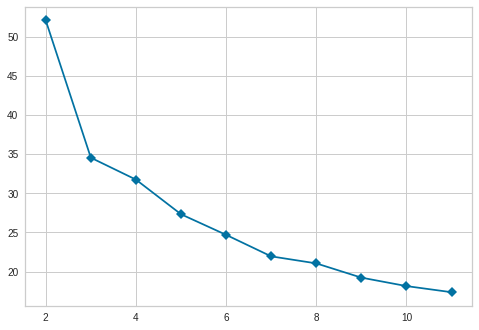

In [0]:
!pip install yellowbrick

groupedClusteringSaoPaulo = groupedSaoPaulo.drop('Neighborhood', 1)

# import k-means from clustering stage
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,12), metric='calinski_harabaz', timings=False, locate_elbow=False)

visualizer.fit(groupedClusteringSaoPaulo)        # Fit the data to the visualizer

visualizer.k_scores_        # Finalize and render the figure


> We will use of 3 for the parameter k of the K-Mean algoritm

**- Use of the K-Means algoritm to mount 3 clusters of neighborhood acording to their TOP 10 venues categories**

In [0]:
# set number of clusters
kClust1 = 3

# run k-means clustering
kmeans = KMeans(n_clusters=kClust1, random_state=1).fit(groupedClusteringSaoPaulo)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 1, 0, 0, 0, 2, 2, 0, 1, 0], dtype=int32)

**- Conservation of the label cluster by Top venues categories of each neighborhood**

In [0]:
# add clustering labels
#venuesSortedNbh.drop(columns=["Cluster Labels"], inplace=True)
venuesSortedNbh.insert(0, 'Cluster By TOP Venues Categ.', kmeans.labels_)
venuesSortedNbh

,Cluster By TOP Venues Categ.,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,Aclimação,Gym / Fitness Center,Pizza Place,Bakery,Pet Store,Coffee Shop,Hostel,Dance Studio,Korean Restaurant,BBQ Joint,Bar
1,1,Alto da Boa Vista,Brazilian Restaurant,Park,Bakery,Japanese Restaurant,Steakhouse,Butcher,Gym,Pizza Place,Music Venue,Department Store
2,0,Alto da Lapa,Bakery,Gym / Fitness Center,Dessert Shop,Plaza,Restaurant,Ice Cream Shop,Pizza Place,Coffee Shop,Burger Joint,Donut Shop
3,0,Alto da Mooca,Bakery,Bar,Pizza Place,Burger Joint,Italian Restaurant,Gym / Fitness Center,Dessert Shop,Deli / Bodega,Dance Studio,Middle Eastern Restaurant
4,0,Alto de Pinheiros,Plaza,Restaurant,Athletics & Sports,Bar,Convenience Store,Park,Bike Rental / Bike Share,Trail,Dog Run,Gym / Fitness Center
...,...,...,...,...,...,...,...,...,...,...,...,...
518,0,Várzea de Baixo,Pizza Place,Mineiro Restaurant,Brazilian Restaurant,Restaurant,Music Venue,Italian Restaurant,Café,Nightclub,Coffee Shop,Lounge
519,0,Água Branca,Brazilian Restaurant,Bar,Soccer Field,Pizza Place,Churrascaria,Convenience Store,Gym,Fast Food Restaurant,Recording Studio,Motorcycle Shop
520,1,Água Fria,Pizza Place,Burger Joint,Japanese Restaurant,Pharmacy,Bakery,Bar,Brazilian Restaurant,Gym,Farmers Market,Middle Eastern Restaurant
521,2,Água Funda,Bakery,Pizza Place,Gym,Café,Plaza,Brazilian Restaurant,Gym / Fitness Center,Market,Rock Club,Grocery Store


## III.2) Clustering of the neighborhood in function of socio-economic indicators (IDH and house price by m2)

**- Preparation and normalization of the data IDH and house price/m2 to use for clustering**

In [0]:
from sklearn import preprocessing

#New data frame of the Sao Paulo neighborhood considering the IDH and the price/m2
dfCluster = dfNbh.loc[0:, ['PriceByM2','Idh']]

#Transformation of the price in number
dfCluster.PriceByM2=dfCluster.PriceByM2.str.replace(pat='R$ ', repl='', regex=False).str.replace(pat='.', repl='', regex=False).astype(np.float)
#Force 0 as Idh for the samples without Idh to can nornalize afterward all the data frame
dfCluster.loc[dfCluster[dfCluster.Idh.isnull()].index, 'Idh']=0
#Normalization of the data frame to use for the clustering
dfCluster=preprocessing.normalize(X=dfCluster, norm='max', axis=0, )
print(dfCluster[0:10])

[[1.         0.99895942]
 [0.97416702 0.99167534]
 [0.96678617 0.99895942]
 [0.95877267 1.        ]
 [0.8954555  0.99583767]
 [0.85528258 1.        ]
 [0.84168073 0.99167534]
 [0.83582876 0.9760666 ]
 [0.7978701  0.99167534]
 [0.70661113 0.99583767]]


**- Search of the optimum k of K-Means with the elbow method**

[0.02902252983811438,
 0.034636431637653724,
 0.0323196443834457,
 0.031346030091926595,
 0.021707684749526647,
 0.020673039106681175,
 0.020130079576639447,
 0.018480931386228742,
 0.018409329767544228,
 0.018556247474571824]

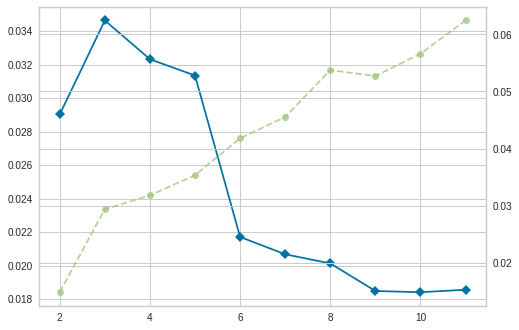

In [0]:
# Instantiate the clustering model and visualizer
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,12), locate_elbow=True)

visualizer.fit(dfCluster)        # Fit the data to the visualizer
visualizer.k_scores_        # Finalize and render the figure

> We will use of 6 for the parameter k of the K-Mean algoritm

**- Use of the K-Means algoritmo to mount 6 clusters of neighborhood acording to their IDH and house price by m2**

In [0]:
# set number of clusters
kClust2 = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kClust2, random_state=1).fit(dfCluster)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 4], dtype=int32)

**- Conservation of the label cluster by socio-economic indicators of each neighborhood**

In [0]:
#Creation of a new data frame, copy of the data frame with the coordinates of each neighborhood
mergedSaoPaulo = dfNbh.copy()
#Add in this new data frame the second clustering label of each neighborhood
mergedSaoPaulo.insert(0, 'Cluster By IDH-M2Price', kmeans.labels_)
mergedSaoPaulo

,Cluster By IDH-M2Price,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh
0,3,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416,PINHEIROS,PINHEIROS,0.960
1,3,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881,PINHEIROS,ITAIM BIBI,0.953
2,3,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685,PINHEIROS,PINHEIROS,0.960
3,3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246,VILA MARIANA,MOEMA,0.961
4,3,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180,PINHEIROS,JARDIM PAULISTA,0.957
...,...,...,...,...,...,...,...,...,...,...
520,0,Parque Savoy City,-1.13%,R$ 3.540,R$ 417.503,-23.56462,-46.48631,ITAQUERA,CIDADE LIDER,NaN
521,0,Parque Casa de Pedra,+0.06%,R$ 3.531,R$ 454.416,-23.45212,-46.60123,JACANA-TREMEMBE,TREMEMBE,NaN
522,0,Conjunto Residencial José Bonifácio,+0.18%,R$ 3.287,R$ 192.838,-23.54756,-46.43445,ITAQUERA,JOSE BONIFACIO,NaN
523,0,Cidade São Mateus,-1.04%,R$ 3.180,R$ 360.973,-23.60128,-46.47860,SAO MATEUS,SAO MATEUS,NaN


## III.3) Representation on a map of the different clusters of each neighborhood

**- Merge on an unique data frame of the two cluster labels of each neighborhood with their latitude and longitude coordinates**

In [0]:
# merge SaoPaulo_grouped with SaoPaulo_data to add latitude/longitude for each neighborhood
mergedSaoPaulo = mergedSaoPaulo.join(venuesSortedNbh.set_index('Neighborhood'), on='Neighborhood')

mergedSaoPaulo.head() # check the first rows

,Cluster By IDH-M2Price,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh,Cluster By TOP Venues Categ.,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416,PINHEIROS,PINHEIROS,0.960,0.0,Italian Restaurant,Restaurant,Middle Eastern Restaurant,Hotel,Steakhouse,Bakery,Japanese Restaurant,Art Museum,Art Gallery,Brazilian Restaurant
1,3,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881,PINHEIROS,ITAIM BIBI,0.953,0.0,Italian Restaurant,Restaurant,Chocolate Shop,Japanese Restaurant,Gym / Fitness Center,Bistro,Salad Place,Spa,Middle Eastern Restaurant,Burger Joint
2,3,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685,PINHEIROS,PINHEIROS,0.960,0.0,Middle Eastern Restaurant,Coffee Shop,Italian Restaurant,Vegetarian / Vegan Restaurant,Pet Store,Café,Brazilian Restaurant,Pizza Place,Ice Cream Shop,Spanish Restaurant
3,3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246,VILA MARIANA,MOEMA,0.961,0.0,Italian Restaurant,Burger Joint,Bar,Yoga Studio,Restaurant,Gym / Fitness Center,Coffee Shop,Middle Eastern Restaurant,Chocolate Shop,Pizza Place
4,3,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180,PINHEIROS,JARDIM PAULISTA,0.957,0.0,Italian Restaurant,Furniture / Home Store,Brazilian Restaurant,Bakery,Salon / Barbershop,Japanese Restaurant,Art Museum,Bookstore,Bar,Greek Restaurant


**- Identification of the neighborhoods without label for the TOP venues categories cluster because none venues has been recovered for these**

In [0]:
mergedSaoPaulo[mergedSaoPaulo["Cluster By TOP Venues Categ."].isnull()]

,Cluster By IDH-M2Price,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh,Cluster By TOP Venues Categ.,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
162,0,Campininha,-0.59%,R$ 6.444,R$ 523.945,-23.23433,-47.87848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178,0,Maranhão,+0.12%,R$ 6.207,R$ 467.925,-1.63333,-44.96667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**- We force these neighborhoods to a new label 3 for this clustering by TOP venues caterories**

In [0]:
mergedSaoPaulo.loc[mergedSaoPaulo["Cluster By TOP Venues Categ."].isnull(), "Cluster By TOP Venues Categ."] = kClust1
mergedSaoPaulo[(mergedSaoPaulo["Cluster By TOP Venues Categ."]==kClust1)]

,Cluster By IDH-M2Price,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh,Cluster By TOP Venues Categ.,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
162,0,Campininha,-0.59%,R$ 6.444,R$ 523.945,-23.23433,-47.87848,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178,0,Maranhão,+0.12%,R$ 6.207,R$ 467.925,-1.63333,-44.96667,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**- To facilitate the visualization of the TOP 10 venues categories cluster label, whose the field has passed to FLOAT with the merge, we force this field to come back to INT**

In [0]:
mergedSaoPaulo.loc[:, 'Cluster By TOP Venues Categ.']=mergedSaoPaulo.loc[:, 'Cluster By TOP Venues Categ.'].astype(np.int)
mergedSaoPaulo

,Cluster By IDH-M2Price,Neighborhood,RateMonth,PriceByM2,MedianPrice,Latitude,Longitude,Subprefecture,District,Idh,Cluster By TOP Venues Categ.,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3,Jardim Europa,+0.73%,R$ 18.968,R$ 7.151.087,-23.57621,-46.68416,PINHEIROS,PINHEIROS,0.960,0,Italian Restaurant,Restaurant,Middle Eastern Restaurant,Hotel,Steakhouse,Bakery,Japanese Restaurant,Art Museum,Art Gallery,Brazilian Restaurant
1,3,Chácara Itaim,-2.25%,R$ 18.478,R$ 7.031.147,-23.59182,-46.67881,PINHEIROS,ITAIM BIBI,0.953,0,Italian Restaurant,Restaurant,Chocolate Shop,Japanese Restaurant,Gym / Fitness Center,Bistro,Salad Place,Spa,Middle Eastern Restaurant,Burger Joint
2,3,Jardim Paulistano,+0.94%,R$ 18.338,R$ 6.756.043,-23.57191,-46.68685,PINHEIROS,PINHEIROS,0.960,0,Middle Eastern Restaurant,Coffee Shop,Italian Restaurant,Vegetarian / Vegan Restaurant,Pet Store,Café,Brazilian Restaurant,Pizza Place,Ice Cream Shop,Spanish Restaurant
3,3,Vila Nova Conceição,+0.52%,R$ 18.186,R$ 4.114.889,-23.59183,-46.67246,VILA MARIANA,MOEMA,0.961,0,Italian Restaurant,Burger Joint,Bar,Yoga Studio,Restaurant,Gym / Fitness Center,Coffee Shop,Middle Eastern Restaurant,Chocolate Shop,Pizza Place
4,3,Jardim América,+0.36%,R$ 16.985,R$ 7.682.567,-23.56921,-46.67180,PINHEIROS,JARDIM PAULISTA,0.957,0,Italian Restaurant,Furniture / Home Store,Brazilian Restaurant,Bakery,Salon / Barbershop,Japanese Restaurant,Art Museum,Bookstore,Bar,Greek Restaurant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
520,0,Parque Savoy City,-1.13%,R$ 3.540,R$ 417.503,-23.56462,-46.48631,ITAQUERA,CIDADE LIDER,NaN,1,Brazilian Restaurant,Burger Joint,Bakery,Pizza Place,Plaza,Metro Station,Paper / Office Supplies Store,Pharmacy,Gym / Fitness Center,Japanese Restaurant
521,0,Parque Casa de Pedra,+0.06%,R$ 3.531,R$ 454.416,-23.45212,-46.60123,JACANA-TREMEMBE,TREMEMBE,NaN,2,Bakery,Gym / Fitness Center,Residential Building (Apartment / Condo),Pet Service,Supermarket,Diner,Candy Store,BBQ Joint,Burger Joint,Bar
522,0,Conjunto Residencial José Bonifácio,+0.18%,R$ 3.287,R$ 192.838,-23.54756,-46.43445,ITAQUERA,JOSE BONIFACIO,NaN,1,Pizza Place,Food Truck,Bakery,Grocery Store,Ice Cream Shop,Pharmacy,Train Station,Gym / Fitness Center,Chinese Restaurant,Bar
523,0,Cidade São Mateus,-1.04%,R$ 3.180,R$ 360.973,-23.60128,-46.47860,SAO MATEUS,SAO MATEUS,NaN,0,Electronics Store,Convenience Store,Candy Store,Pharmacy,Grocery Store,Pizza Place,Bakery,Burger Joint,Gift Shop,Martial Arts Dojo


**- Representation on the Sao Paulo city map of the neighborhood clusters, using a color different by label IDH/priceM2 cluster for the circle of the neighborhood marker and a color different by label TOP 10 venues categories to fill the marker**

In [0]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# set color scheme for the clusters of TOP 10 categories venues
x = np.arange(kClust1)
ys = [i + x + (i*x)**2 for i in range(kClust1)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow1 = [colors.rgb2hex(i) for i in colors_array]
rainbow1 = ['green', 'red', 'blue', 'white']

# set color scheme for the clusters of socio-economic indicators
x = np.arange(kClust2)
ys = [i + x + (i*x)**2 for i in range(kClust2)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow2 = [colors.rgb2hex(i) for i in colors_array]
rainbow2 = ['yellow', 'chartreuse', 'orange', 'black', 'violet', 'purple']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster1, cluster2 in \
    zip(mergedSaoPaulo['Latitude'], mergedSaoPaulo['Longitude'], mergedSaoPaulo['Neighborhood'], mergedSaoPaulo['Cluster By TOP Venues Categ.'], mergedSaoPaulo['Cluster By IDH-M2Price']):
    label = folium.Popup(str(poi) + ' Venues Cat Cluster  ' + str(cluster1) + ' IDH-PrM2 Cluster  ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=6,
        popup=label,
        color=rainbow2[int(cluster2)],
        fill=True,
        fill_color=rainbow1[int(cluster1)],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# IV) Study of the principal neighborhood cluster groups (cartesian product of the TOP 10 venues categories cluster and of the IDH-priceM2 cluster)

## IV.1) Verify if some neighborhood cluster groups have a localisation concentration 

**- Loop on each neighborhood cluster group to consult the localization of their neighborhood and eventually input a description of this localisation**

In [0]:
for numClust1 in range(0, kClust1+1):
  for numClust2 in range(0, kClust2):
    dbClust=mergedSaoPaulo.loc[((mergedSaoPaulo['Cluster By TOP Venues Categ.'] == numClust1)&(mergedSaoPaulo['Cluster By IDH-M2Price'] == numClust2)), \
                               mergedSaoPaulo.columns[[[1] + [3] + [9] + list(range(11, 21)) + [5] + [6]]]]
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)
    for lat, lon, poi in zip(dbClust['Latitude'], dbClust['Longitude'], dbClust['Neighborhood']):
      folium.CircleMarker([lat, lon], radius=6, popup=str(poi), color=rainbow2[int(numClust2)],
                          fill=True, fill_color=rainbow1[int(numClust1)], fill_opacity=0.7).add_to(map_clusters)   
    display(map_clusters)
    print("Cluster By Top Venues Categ. <{0}> - Cluster By IDH-M2Price <{1}>: {2} neighborhood".format(numClust1, numClust2, dbClust.shape[0]))
    try:
      descLocal = input("Please enter a localisation description of these neighborhood defined by these two clusters and press enter:")
    except SyntaxError:
      pass
    mergedSaoPaulo.loc[((mergedSaoPaulo['Cluster By TOP Venues Categ.'] == numClust1)&(mergedSaoPaulo['Cluster By IDH-M2Price'] == numClust2)), \
                       "DescLocal"] = descLocal
    
    

    

/usr/local/lib/python3.6/dist-packages/pandas/core/indexes/base.py:3940: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = getitem(key)


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <0>: 45 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:External Perifery and Center


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <1>: 82 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:Internal Periphery


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <2>: 69 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:External Periphery


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <3>: 9 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:Center West


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <4>: 44 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:West North-Center-South


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <5>: 35 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:Center, East and South


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <0>: 71 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:External Periphery


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <1>: 10 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <2>: 72 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:External Periphery


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <3>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <4>: 1 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <5>: 5 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <0>: 30 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <1>: 4 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <2>: 44 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:External Periphery


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <3>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <4>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <5>: 2 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <0>: 2 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <1>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <2>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <3>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <4>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


Cluster By Top Venues Categ. <3> - Cluster By IDH-M2Price <5>: 0 neighborhood
Please enter a localisation description of these neighborhood defined by these two clusters and press enter:


**- Neighborhood cluster groups with e description localisation inputed**

In [0]:
groupCluster = mergedSaoPaulo.loc[(mergedSaoPaulo.DescLocal.str.len()>0), ['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescLocal']]
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescLocal'])
groupCluster.size()
groupCluster.agg({'DescLocal':['count']})


DescLocal
                                                                                     count
Cluster By TOP Venues Categ. Cluster By IDH-M2Price DescLocal                             
0                            0                      Internal Perifery and Center        45
                             1                      Internal Periphery                  82
                             2                      External Periphery                  69
                             3                      Center West                          9
                             4                      West North-Center-South             44
                             5                      Center, East and South              35
1                            0                      External Periphery                  71
                             2                      External Periphery                  72
2                            2                      External Periphery                  44

In [0]:
mergedSaoPaulo.loc[((mergedSaoPaulo['Cluster By TOP Venues Categ.'] == 0) & (mergedSaoPaulo['Cluster By IDH-M2Price']==0)), ['DescLocal']] = \
'Internal Perifery and Center'

## IV.2) Study of the socio-economic indicators of each neighborhood cluster group 

**- To simplify, the study stays with the cluster groups with more that 4 neighborhood**

In [0]:
groupCluster = mergedSaoPaulo.copy()
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price'], as_index=True)

groupCluster=groupCluster.filter(lambda x: x['DescLocal'].count() > 4)
#groupCluster=groupCluster.filter(lambda x: x.size < 8)
groupCluster.shape

(516, 22)

**- Transformation in number of the price by m2, to can have a numerical statistical description of the series of each neighborhood cluster group**

In [0]:
#Transformation of the price in number
groupCluster.PriceByM2=groupCluster.PriceByM2.str.replace(pat='R$ ', repl='', regex=False).str.replace(pat='.', repl='', regex=False).astype(np.float)

**- Grouping of the neighborhoods by theirs two label clusters (TOP venue categories and IDH-price by m2**

In [0]:
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price'])

**- Statistical Description of the IDH and price by m2 of each cluster group**

In [0]:
groupCluster.agg({'Idh':['min', 'max', 'mean'], 'PriceByM2': ['min', 'max', 'mean']})
groupCluster['Idh', 'PriceByM2'].describe()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


Idh  ... PriceByM2
                                                    count  ...       max
Cluster By TOP Venues Categ. Cluster By IDH-M2Price        ...          
0                            0                        0.0  ...    6400.0
                             1                       82.0  ...    8754.0
                             2                       69.0  ...    6274.0
                             3                        9.0  ...   18968.0
                             4                       44.0  ...   13403.0
                             5                        0.0  ...   11253.0
1                            0                        0.0  ...    6273.0
                             1                       10.0  ...    8394.0
                             2                       72.0  ...    6390.0
                             5                        0.0  ...   10039.0
2                            0                        0.0  ...    6310.0
                             2                       44.0  ...    6148.0

[12 rows x 16 columns]

**- Loop on each neighborhood cluster group to consult the statistics of the IDH and price by m2 series and eventually input a description of these statistics**

In [0]:
for labClust, grp in groupCluster:
  display(grp.loc[:, ('Idh', 'PriceByM2')].describe())
  print("Cluster By Top Venues Categ. <{0}> - Cluster By IDH-M2Price <{1}>: {2} neighborhood".format(labClust[0], labClust[1], grp.shape[0]))
  try:
    descSocEco = input("Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:")
  except SyntaxError:
    pass
  mergedSaoPaulo.loc[((mergedSaoPaulo['Cluster By TOP Venues Categ.'] == labClust[0])&(mergedSaoPaulo['Cluster By IDH-M2Price'] == labClust[1])), \
                       "DescSocEco"] = descSocEco


,Idh,PriceByM2
count,0.0,45.000000
mean,NaN,5392.266667
std,NaN,758.322593
min,NaN,3180.000000
25%,NaN,4729.000000
50%,NaN,5574.000000
75%,NaN,6008.000000
max,NaN,6400.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <0>: 45 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Without IDH and low price/m2


,Idh,PriceByM2
count,82.000000,82.000000
mean,0.907317,7004.219512
std,0.033136,877.574309
min,0.806000,5288.000000
25%,0.885000,6347.500000
50%,0.909000,6892.000000
75%,0.938000,7641.000000
max,0.957000,8754.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <1>: 82 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Medium IDH and price/m2


,Idh,PriceByM2
count,69.000000,69.000000
mean,0.859449,5108.739130
std,0.035571,582.288554
min,0.795000,4008.000000
25%,0.834000,4648.000000
50%,0.858000,5225.000000
75%,0.884000,5521.000000
max,0.957000,6274.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <2>: 69 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Low IDH and price/m2


,Idh,PriceByM2
count,9.000000,9.000000
mean,0.955111,17125.666667
std,0.007305,1395.648147
min,0.938000,15134.000000
25%,0.953000,15965.000000
50%,0.957000,16985.000000
75%,0.960000,18338.000000
max,0.961000,18968.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <3>: 9 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Very High IDH and price/m2


,Idh,PriceByM2
count,44.000000,44.000000
mean,0.947614,10351.363636
std,0.012301,1405.101521
min,0.907000,8602.000000
25%,0.941000,9218.750000
50%,0.953000,9823.500000
75%,0.957000,11410.000000
max,0.961000,13403.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <4>: 44 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Very High IDH and high price/m2


,Idh,PriceByM2
count,0.0,35.000000
mean,NaN,7924.657143
std,NaN,1145.501148
min,NaN,6703.000000
25%,NaN,7055.500000
50%,NaN,7618.000000
75%,NaN,8424.000000
max,NaN,11253.000000


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <5>: 35 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Without IDH and medium price/m2


,Idh,PriceByM2
count,0.0,71.000000
mean,NaN,4754.985915
std,NaN,678.347582
min,NaN,3287.000000
25%,NaN,4295.000000
50%,NaN,4685.000000
75%,NaN,5217.000000
max,NaN,6273.000000


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <0>: 71 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Without IDH and very low price/m2


,Idh,PriceByM2
count,10.000000,10.000000
mean,0.867500,6669.000000
std,0.053284,947.669656
min,0.777000,5520.000000
25%,0.827250,6007.750000
50%,0.873500,6404.500000
75%,0.913750,7048.500000
max,0.935000,8394.000000


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <1>: 10 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Low IDH and medium price/m2


,Idh,PriceByM2
count,72.000000,72.000000
mean,0.841986,4897.444444
std,0.034379,627.144386
min,0.766000,3685.000000
25%,0.822750,4502.500000
50%,0.841000,4895.500000
75%,0.864000,5298.250000
max,0.935000,6390.000000


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <2>: 72 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Low IDH and price/M2


,Idh,PriceByM2
count,0.0,5.000000
mean,NaN,7875.800000
std,NaN,1582.875295
min,NaN,6520.000000
25%,NaN,6528.000000
50%,NaN,7268.000000
75%,NaN,9024.000000
max,NaN,10039.000000


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <5>: 5 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Without IDH and medium price/m2


,Idh,PriceByM2
count,0.0,30.000000
mean,NaN,4764.333333
std,NaN,764.484245
min,NaN,3123.000000
25%,NaN,4188.500000
50%,NaN,4757.000000
75%,NaN,5220.250000
max,NaN,6310.000000


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <0>: 30 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Without IDH and very low price/m2


,Idh,PriceByM2
count,44.000000,44.000000
mean,0.836705,4723.522727
std,0.030620,572.267155
min,0.762000,3591.000000
25%,0.819000,4364.250000
50%,0.838500,4583.000000
75%,0.859500,5031.000000
max,0.892000,6148.000000


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <2>: 44 neighborhood
Please enter a social-economic description of these neighborhood defined by these two clusters and press enter:Very low IDH and low price/m2


**- Neighborhood cluster groups with a socio-economic description inputed**

In [0]:
groupCluster = mergedSaoPaulo.loc[(mergedSaoPaulo.DescSocEco.str.len()>0), ['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescSocEco']]
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescSocEco'])
groupCluster.size()

Cluster By TOP Venues Categ.  Cluster By IDH-M2Price  DescSocEco                       
0                             0                       Without IDH and low price/m2         45
                              1                       Medium IDH and price/m2              82
                              2                       Low IDH and price/m2                 69
                              3                       Very High IDH and price/m2            9
                              4                       Very High IDH and high price/m2      44
                              5                       Without IDH and medium price/m2      35
1                             0                       Without IDH and very low price/m2    71
                              1                       Low IDH and medium price/m2          10
                              2                       Low IDH and price/M2                 72
                              5                       Without IDH 

## IV.3) Study of the venues categories of each neighborhood cluster group 

**- To simplify, the study stays with the cluster groups with more that 4 neighborhood**

In [0]:
groupCluster = mergedSaoPaulo.copy()
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price'], as_index=True)

groupCluster=groupCluster.filter(lambda x: x['DescSocEco'].count() > 4)
#groupCluster=groupCluster.filter(lambda x: x.size < 8)
display(groupCluster.shape)

(516, 23)

**- Grouping of the neighborhoods by theirs two label clusters (TOP venue categories and IDH-price by m2**

In [0]:
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price'])

**- Loop on each neighborhood cluster group to consult statistics about the TOP10 venue categories and eventually input a description of these statistics**

In [0]:
pd.set_option('display.max_rows', None)
for labClust, grp in groupCluster:
  display(grp.loc[:, mergedSaoPaulo.columns[list(range(11, 21))]])
  display(grp.loc[:, mergedSaoPaulo.columns[list(range(11, 21))]].describe())
  print("Cluster By Top Venues Categ. <{0}> - Cluster By IDH-M2Price <{1}>: {2} neighborhood".format(labClust[0], labClust[1], grp.shape[0]))
  try:
    descVenCat = input("Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:")
  except SyntaxError:
    pass
  mergedSaoPaulo.loc[((mergedSaoPaulo['Cluster By TOP Venues Categ.'] == labClust[0])&(mergedSaoPaulo['Cluster By IDH-M2Price'] == labClust[1])), \
                       "DescVenCat"] = descVenCat

,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
164,Brazilian Restaurant,Bar,Bakery,Café,Pet Store,Dessert Shop,Gym,Pizza Place,Gym / Fitness Center,Burger Joint
167,Theater,Brazilian Restaurant,Women's Store,Bar,Middle Eastern Restaurant,Peruvian Restaurant,Café,Pizza Place,Dessert Shop,Electronics Store
170,Brazilian Restaurant,Sandwich Place,Italian Restaurant,Clothing Store,Food & Drink Shop,Restaurant,Deli / Bodega,Market,Department Store,Gourmet Shop
172,Brazilian Restaurant,Bakery,Steakhouse,Pizza Place,Clothing Store,Ice Cream Shop,Bar,Food & Drink Shop,Diner,Juice Bar
177,Pizza Place,Pharmacy,Bakery,Brazilian Restaurant,Pet Store,Dessert Shop,Burger Joint,Supermarket,Bar,Martial Arts Dojo
182,Brazilian Restaurant,Café,Supermarket,Gym / Fitness Center,Grocery Store,Food Truck,Park,Cocktail Bar,Gym,Salon / Barbershop
184,Pharmacy,Pizza Place,Italian Restaurant,Brazilian Restaurant,Restaurant,Snack Place,Japanese Restaurant,Fast Food Restaurant,Clothing Store,Coffee Shop
186,Bakery,Brazilian Restaurant,Japanese Restaurant,Gym / Fitness Center,Pizza Place,Burger Joint,Pet Store,Pharmacy,Bar,Mexican Restaurant
196,Ice Cream Shop,Supermarket,Restaurant,Plaza,Snack Place,Bakery,Bus Station,Burger Joint,Pizza Place,Nightclub
201,Japanese Restaurant,Bakery,Pizza Place,BBQ Joint,Grocery Store,Dessert Shop,Gym,Restaurant,Gym / Fitness Center,Park


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,45,45,45,45,45,45,45,45,45,45
unique,16,21,22,19,25,27,26,30,28,31
top,Brazilian Restaurant,Brazilian Restaurant,Pizza Place,Pharmacy,Restaurant,Gym / Fitness Center,Dessert Shop,Burger Joint,Pizza Place,Burger Joint
freq,9,7,7,5,4,4,6,6,4,5


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <0>: 45 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Restaurant (principally Brazilian)


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
59,Pizza Place,Dessert Shop,Ice Cream Shop,Brazilian Restaurant,Restaurant,Spa,Japanese Restaurant,Café,Bakery,Jewelry Store
60,Pizza Place,Bar,Dessert Shop,Japanese Restaurant,Music Venue,Gym / Fitness Center,Plaza,Pharmacy,Burger Joint,Supermarket
63,Coffee Shop,Italian Restaurant,Café,Middle Eastern Restaurant,Pharmacy,Brazilian Restaurant,Cosmetics Shop,Office,Chocolate Shop,Bookstore
66,Brazilian Restaurant,Pizza Place,Dessert Shop,Restaurant,Italian Restaurant,Burger Joint,Supermarket,Hotel,Farmers Market,Pharmacy
69,Gym,Restaurant,Bakery,Pet Store,Park,Nightclub,Event Space,Japanese Restaurant,Supermarket,Pharmacy
73,Café,Soccer Stadium,Plaza,Pharmacy,Restaurant,Gym / Fitness Center,Gym,Tea Room,Sports Bar,Athletics & Sports
74,Clothing Store,Brazilian Restaurant,Bar,Pizza Place,Gym,Chocolate Shop,Theater,Steakhouse,Gym / Fitness Center,Tea Room
77,Plaza,Pharmacy,Gym / Fitness Center,Pizza Place,Bakery,Sushi Restaurant,Brazilian Restaurant,Supermarket,Burger Joint,Cosmetics Shop
78,Bar,Brazilian Restaurant,Dessert Shop,Airport Service,Chocolate Shop,Café,Pizza Place,Burger Joint,Bakery,Gym / Fitness Center
79,Pharmacy,Restaurant,Brazilian Restaurant,Bakery,Pastelaria,Pizza Place,Japanese Restaurant,Gym / Fitness Center,Salon / Barbershop,Martial Arts Dojo


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,82,82,82,82,82,82,82,82,82,82
unique,18,22,26,31,32,39,39,47,51,45
top,Brazilian Restaurant,Pizza Place,Bakery,Pharmacy,Gym / Fitness Center,Gym / Fitness Center,Gym,Burger Joint,Bakery,Pizza Place
freq,15,13,14,12,7,9,8,6,6,6


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <1>: 82 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Restaurant (principally Brazilian) and Pizzeria 


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
173,Bar,Bakery,Gym / Fitness Center,Pharmacy,Brazilian Restaurant,Burger Joint,Pet Store,Pizza Place,Restaurant,Ice Cream Shop
192,Bar,Pharmacy,BBQ Joint,Bakery,Pizza Place,Soccer Field,Restaurant,Beer Garden,Gym / Fitness Center,Japanese Restaurant
206,Clothing Store,Brazilian Restaurant,Snack Place,Grocery Store,Fast Food Restaurant,Shoe Store,Plaza,Gym,Pizza Place,Bakery
210,Brazilian Restaurant,Korean Restaurant,Dessert Shop,Café,Women's Store,Restaurant,Bar,Coffee Shop,Vietnamese Restaurant,Art Gallery
211,Bar,Pizza Place,Bakery,Dance Studio,Dessert Shop,Burger Joint,Pet Store,Deli / Bodega,Coffee Shop,Ice Cream Shop
213,Restaurant,Museum,Gym,Flower Shop,Plaza,Clothing Store,Tennis Court,Field,Diner,Gym Pool
218,Brazilian Restaurant,Pizza Place,Fast Food Restaurant,Clothing Store,Restaurant,Sporting Goods Shop,Snack Place,Department Store,Café,Sandwich Place
221,Pharmacy,Bakery,Brazilian Restaurant,Grocery Store,Plaza,Burger Joint,Pizza Place,Candy Store,Bar,Gym
225,Brazilian Restaurant,Department Store,Clothing Store,Restaurant,Pizza Place,Fast Food Restaurant,Bakery,Dessert Shop,Café,Sporting Goods Shop
229,Clothing Store,Pizza Place,Dessert Shop,Pharmacy,Fast Food Restaurant,Gym,Sushi Restaurant,Restaurant,Park,Tea Room


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,69,69,69,69,69,69,69,69,69,69
unique,18,25,29,31,31,36,36,44,47,39
top,Bakery,Pizza Place,Gym / Fitness Center,Bakery,Gym / Fitness Center,Pharmacy,Brazilian Restaurant,Gym,Brazilian Restaurant,Japanese Restaurant
freq,10,12,7,11,9,7,6,5,4,5


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <2>: 69 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Bakery and Pizzeria


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Italian Restaurant,Restaurant,Middle Eastern Restaurant,Hotel,Steakhouse,Bakery,Japanese Restaurant,Art Museum,Art Gallery,Brazilian Restaurant
1,Italian Restaurant,Restaurant,Chocolate Shop,Japanese Restaurant,Gym / Fitness Center,Bistro,Salad Place,Spa,Middle Eastern Restaurant,Burger Joint
2,Middle Eastern Restaurant,Coffee Shop,Italian Restaurant,Vegetarian / Vegan Restaurant,Pet Store,Café,Brazilian Restaurant,Pizza Place,Ice Cream Shop,Spanish Restaurant
3,Italian Restaurant,Burger Joint,Bar,Yoga Studio,Restaurant,Gym / Fitness Center,Coffee Shop,Middle Eastern Restaurant,Chocolate Shop,Pizza Place
4,Italian Restaurant,Furniture / Home Store,Brazilian Restaurant,Bakery,Salon / Barbershop,Japanese Restaurant,Art Museum,Bookstore,Bar,Greek Restaurant
5,Park,Plaza,Athletics & Sports,Dessert Shop,Café,Middle Eastern Restaurant,Burger Joint,Brazilian Restaurant,Art Gallery,Pizza Place
6,Italian Restaurant,Japanese Restaurant,Coffee Shop,Mediterranean Restaurant,Burger Joint,Chocolate Shop,Restaurant,Cycle Studio,Cosmetics Shop,Hotel
7,Café,Coffee Shop,Italian Restaurant,Dessert Shop,Boutique,Brazilian Restaurant,Gym / Fitness Center,Argentinian Restaurant,Chocolate Shop,Restaurant
8,Multiplex,Boutique,Italian Restaurant,Gym / Fitness Center,Steakhouse,Pastry Shop,Restaurant,Gymnastics Gym,Hotel,Chocolate Shop


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,9,9,9,9,9,9,9,9,9,9
unique,5,7,7,8,8,9,8,9,7,8
top,Italian Restaurant,Restaurant,Italian Restaurant,Dessert Shop,Steakhouse,Japanese Restaurant,Restaurant,Gymnastics Gym,Chocolate Shop,Pizza Place
freq,5,2,3,2,2,1,2,1,2,2


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <3>: 9 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Restaurant (principally Italian)


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,Brazilian Restaurant,Hotel,Ice Cream Shop,Bakery,Italian Restaurant,Pizza Place,Coffee Shop,Restaurant,Argentinian Restaurant,Comic Shop
10,Ice Cream Shop,Dessert Shop,Chocolate Shop,Hotel,Brazilian Restaurant,Bar,Health & Beauty Service,Bakery,Japanese Restaurant,Gym
11,Burger Joint,Ice Cream Shop,Spa,Coffee Shop,Supermarket,Bakery,Cosmetics Shop,Bar,Health & Beauty Service,Gym / Fitness Center
12,Italian Restaurant,Art Gallery,Brazilian Restaurant,Hotel,Middle Eastern Restaurant,Ice Cream Shop,Bakery,Coffee Shop,Burger Joint,Athletics & Sports
13,Coffee Shop,Spa,Café,Sushi Restaurant,Japanese Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Burger Joint,Restaurant,Hostel
14,Art Gallery,Burger Joint,Bar,Restaurant,Pet Store,Dessert Shop,Vegetarian / Vegan Restaurant,Café,Pizza Place,Bookstore
15,Dessert Shop,Bar,Pizza Place,Burger Joint,Pharmacy,Italian Restaurant,Vegetarian / Vegan Restaurant,Brazilian Restaurant,Bakery,Pet Store
16,Cosmetics Shop,Clothing Store,Coffee Shop,Italian Restaurant,Café,Chocolate Shop,Middle Eastern Restaurant,Steakhouse,Dessert Shop,Lounge
17,Dessert Shop,Japanese Restaurant,Ice Cream Shop,Pet Store,Brazilian Restaurant,Chocolate Shop,Bar,Bakery,Hotel,Pizza Place
18,Hotel,Italian Restaurant,Gym,Gym / Fitness Center,Coffee Shop,Café,Vegetarian / Vegan Restaurant,Brazilian Restaurant,Dessert Shop,Boutique


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,44,44,44,44,44,44,44,44,44,44
unique,21,24,25,23,24,26,27,24,29,32
top,Brazilian Restaurant,Pizza Place,Brazilian Restaurant,Pet Store,Brazilian Restaurant,Gym / Fitness Center,Burger Joint,Coffee Shop,Dessert Shop,Gym / Fitness Center
freq,8,7,5,6,5,4,4,6,4,4


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <4>: 44 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Restaurant (principally Brazilian) and Pizzeria


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
21,Bakery,Ice Cream Shop,Italian Restaurant,Athletics & Sports,Dessert Shop,Plaza,Coffee Shop,Spa,Pizza Place,Gym / Fitness Center
23,Coffee Shop,Theater,Movie Theater,Brazilian Restaurant,Hotel,Gym,Dance Studio,Café,Ice Cream Shop,Burger Joint
34,Brazilian Restaurant,Convenience Store,Electronics Store,Supermarket,BBQ Joint,Candy Store,Chocolate Shop,Coffee Shop,Theater,Bakery
38,Pizza Place,Italian Restaurant,Coffee Shop,Dessert Shop,Bakery,Middle Eastern Restaurant,Beer Bar,Restaurant,Brazilian Restaurant,Café
57,Dessert Shop,Japanese Restaurant,Gym / Fitness Center,Fruit & Vegetable Store,Pizza Place,Cosmetics Shop,Bar,Dance Studio,Pet Store,Pharmacy
58,Brazilian Restaurant,Restaurant,Theater,Cultural Center,Café,Bar,Coffee Shop,Bakery,Peruvian Restaurant,Art Gallery
61,Pizza Place,Gym / Fitness Center,Pet Store,Bakery,Japanese Restaurant,Middle Eastern Restaurant,Restaurant,Brazilian Restaurant,BBQ Joint,Spa
68,Dessert Shop,Japanese Restaurant,Gym / Fitness Center,Cosmetics Shop,Fruit & Vegetable Store,Veterinarian,Café,Brewery,Brazilian Restaurant,Burger Joint
70,Theater,Japanese Restaurant,Cultural Center,Grocery Store,Brazilian Restaurant,Food & Drink Shop,Arts & Crafts Store,Art Gallery,Middle Eastern Restaurant,Café
72,Brazilian Restaurant,Coffee Shop,Pizza Place,Italian Restaurant,Bar,Peruvian Restaurant,Hotel,Middle Eastern Restaurant,Restaurant,Theater


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,35,35,35,35,35,35,35,35,35,35
unique,11,16,20,20,19,24,24,25,24,26
top,Restaurant,Bar,Pizza Place,Brazilian Restaurant,Bakery,Middle Eastern Restaurant,Bar,Italian Restaurant,Pizza Place,Burger Joint
freq,7,5,5,5,5,3,3,4,5,4


Cluster By Top Venues Categ. <0> - Cluster By IDH-M2Price <5>: 35 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Restaurant and Bar


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
174,Pizza Place,Bakery,Restaurant,Burger Joint,Bar,Gym / Fitness Center,Brazilian Restaurant,Plaza,Food,Japanese Restaurant
176,Bakery,Pharmacy,Pizza Place,Diner,Food Truck,Gym,Gym / Fitness Center,Fast Food Restaurant,Burger Joint,Farmers Market
194,Pizza Place,Food Truck,Bakery,Cosmetics Shop,Gym,Gym / Fitness Center,Harbor / Marina,South American Restaurant,Farm,Supermarket
195,Bakery,Plaza,Grocery Store,Soccer Field,Pizza Place,Gym,Burger Joint,Ice Cream Shop,Japanese Restaurant,Supermarket
228,Bakery,Pizza Place,Gym / Fitness Center,Farmers Market,Acai House,Gourmet Shop,Coffee Shop,Grocery Store,Food & Drink Shop,Bar
230,Fast Food Restaurant,Gym,Pizza Place,Bakery,Supermarket,BBQ Joint,Pastelaria,Bar,Sandwich Place,Grocery Store
236,Bakery,Gym,Pizza Place,Brazilian Restaurant,Japanese Restaurant,Snack Place,Convenience Store,Sandwich Place,Pharmacy,Dessert Shop
250,Bakery,Pizza Place,Restaurant,Nightclub,Soccer Field,Convenience Store,Park,Fried Chicken Joint,Asian Restaurant,Café
251,Bakery,Pizza Place,Gym / Fitness Center,Bar,Japanese Restaurant,Soccer Field,Clothing Store,Pharmacy,Gym,Theater
252,Pizza Place,Bakery,Gym / Fitness Center,Sushi Restaurant,Pharmacy,Japanese Restaurant,Gym,Park,Chinese Restaurant,Restaurant


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,71,71,71,71,71,71,71,71,71,71
unique,13,19,23,34,34,33,42,39,44,43
top,Bakery,Bakery,Pizza Place,Bakery,Pharmacy,Gym / Fitness Center,Brazilian Restaurant,Ice Cream Shop,Farmers Market,Grocery Store
freq,27,21,13,7,7,6,5,6,4,5


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <0>: 71 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Bakery


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
71,Brazilian Restaurant,Park,Bakery,Japanese Restaurant,Steakhouse,Butcher,Gym,Pizza Place,Music Venue,Department Store
86,Pizza Place,Bakery,Gym,Supermarket,Pharmacy,Market,Restaurant,Ice Cream Shop,Gymnastics Gym,Middle Eastern Restaurant
124,Pizza Place,Bakery,Food & Drink Shop,Brazilian Restaurant,Bookstore,Market,Gym,Drugstore,Athletics & Sports,Fast Food Restaurant
126,Pizza Place,Bakery,Pet Store,Food Truck,Park,Pharmacy,Bar,Italian Restaurant,Dessert Shop,Steakhouse
142,Pizza Place,Bakery,Brazilian Restaurant,BBQ Joint,Bagel Shop,Deli / Bodega,Grocery Store,Tapiocaria,Toy / Game Store,Pastelaria
200,Brazilian Restaurant,Pizza Place,Soccer Field,Gym / Fitness Center,Farmers Market,Gym,Bakery,Sandwich Place,Pet Store,Pastelaria
202,Bakery,Gym / Fitness Center,Supermarket,Farmers Market,Gym,Japanese Restaurant,Plaza,Restaurant,Bus Station,Fast Food Restaurant
205,Bakery,Gym / Fitness Center,Pizza Place,Gym,Spa,Market,BBQ Joint,Burger Joint,Bar,Brazilian Restaurant
219,Pizza Place,Burger Joint,Japanese Restaurant,Pharmacy,Bakery,Bar,Brazilian Restaurant,Gym,Farmers Market,Middle Eastern Restaurant
267,Pizza Place,Bar,Snack Place,Juice Bar,Bakery,Bike Rental / Bike Share,Pet Store,Gym,Burger Joint,Market


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,10,10,10,10,10,10,10,10,10,10
unique,3,6,10,10,9,8,9,9,10,7
top,Pizza Place,Bakery,Snack Place,Japanese Restaurant,Bakery,Market,Gym,Gym,Music Venue,Middle Eastern Restaurant
freq,6,4,1,1,2,3,2,2,1,2


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <1>: 10 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Pizzeria and Bakery


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
165,Bakery,Pizza Place,Plaza,Farmers Market,Pet Store,Grocery Store,Sandwich Place,Food Truck,Gym / Fitness Center,Gym
193,Bakery,Pizza Place,Pharmacy,Gym,Fast Food Restaurant,Brazilian Restaurant,Fried Chicken Joint,Mobile Phone Shop,Park,Chinese Restaurant
207,Pizza Place,Bakery,Farmers Market,Pet Store,Gym / Fitness Center,Plaza,Sandwich Place,Pharmacy,Steakhouse,Grocery Store
223,Pizza Place,Bar,Gym / Fitness Center,Gym,Farmers Market,Ice Cream Shop,Clothing Store,Pet Store,Department Store,Middle Eastern Restaurant
224,Bakery,Pizza Place,Farmers Market,Brazilian Restaurant,Snack Place,Food & Drink Shop,Tennis Court,Dog Run,Japanese Restaurant,Café
227,Pizza Place,Bakery,Pharmacy,Japanese Restaurant,Brazilian Restaurant,Burger Joint,Pet Store,Shop & Service,Restaurant,Park
231,Pizza Place,Pharmacy,Bakery,Supermarket,Brazilian Restaurant,Japanese Restaurant,Fast Food Restaurant,Cosmetics Shop,Café,Pet Store
235,Bakery,Pizza Place,Burger Joint,Farmers Market,Dessert Shop,Pharmacy,Pet Store,Martial Arts Dojo,BBQ Joint,Road
238,Pharmacy,Bakery,Gym,Brazilian Restaurant,Pizza Place,Snack Place,Gym / Fitness Center,Burger Joint,Pet Store,Grocery Store
239,Brazilian Restaurant,Pizza Place,Bakery,Fast Food Restaurant,Department Store,Snack Place,Sandwich Place,Flea Market,Tea Room,Soccer Field


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,72,72,72,72,72,72,72,72,72,72
unique,12,14,28,27,31,37,39,41,42,41
top,Pizza Place,Pizza Place,Bakery,Gym,Gym / Fitness Center,Brazilian Restaurant,Pet Store,Gym / Fitness Center,Supermarket,Farmers Market
freq,33,26,10,11,6,5,5,6,4,5


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <2>: 72 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Pizzeria


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
31,Pizza Place,Food Truck,Gym / Fitness Center,Brazilian Restaurant,Grocery Store,Bakery,Bus Station,Gym,BBQ Joint,Theater
52,Gym / Fitness Center,Grocery Store,Bakery,Sushi Restaurant,Supermarket,Market,Shoe Store,Skate Park,Food Truck,Pharmacy
114,Pizza Place,Brazilian Restaurant,Bakery,Juice Bar,Restaurant,Farmers Market,Music Venue,Bar,Gym / Fitness Center,Brewery
156,Bakery,Pizza Place,Grocery Store,Gym / Fitness Center,Bar,Japanese Restaurant,Farmers Market,Ice Cream Shop,Restaurant,Burger Joint
158,Gym,Pizza Place,Middle Eastern Restaurant,Gym / Fitness Center,Pharmacy,Bar,Coffee Shop,Snack Place,Farmers Market,Baby Store


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,5,5,5,5,5,5,5,5,5,5
unique,4,4,4,4,5,5,5,5,5,5
top,Pizza Place,Pizza Place,Bakery,Gym / Fitness Center,Restaurant,Bakery,Shoe Store,Snack Place,Gym / Fitness Center,Theater
freq,2,2,2,2,1,1,1,1,1,1


Cluster By Top Venues Categ. <1> - Cluster By IDH-M2Price <5>: 5 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Pizzeria


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
169,Bakery,Pizza Place,Dessert Shop,Pharmacy,Grocery Store,Gym,Gym / Fitness Center,Sandwich Place,Farmers Market,Plaza
198,Bakery,Grocery Store,Plaza,Soccer Field,Snack Place,Bar,Italian Restaurant,Supermarket,Middle Eastern Restaurant,Gift Shop
217,Market,Bakery,Pet Store,Pharmacy,Food Truck,Pizza Place,Farmers Market,Snack Place,Bar,Thrift / Vintage Store
249,Grocery Store,Bakery,Convenience Store,Pharmacy,Ice Cream Shop,Public Art,Plaza,Diner,Salon / Barbershop,Coffee Shop
254,Pharmacy,Grocery Store,Bakery,Gym / Fitness Center,Restaurant,Liquor Store,Food,Market,Paper / Office Supplies Store,Clothing Store
258,Bakery,Italian Restaurant,Bar,Plaza,Market,Gym,Brazilian Restaurant,Burger Joint,Farmers Market,Supermarket
303,Bakery,Pharmacy,Pizza Place,Gym / Fitness Center,Supermarket,Food Truck,Athletics & Sports,Gymnastics Gym,Farmers Market,Asian Restaurant
310,Bakery,Pizza Place,Diner,Gym / Fitness Center,Grocery Store,Snack Place,Gym,Brazilian Restaurant,Shopping Plaza,Steakhouse
323,Bakery,Grocery Store,Gym / Fitness Center,Market,Bagel Shop,Pharmacy,Supermarket,Bus Station,Pizza Place,Athletics & Sports
324,Bakery,Brazilian Restaurant,Grocery Store,Bus Station,Pharmacy,Market,Food,Electronics Store,Japanese Restaurant,Gymnastics Gym


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,30,30,30,30,30,30,30,30,30,30
unique,6,13,20,19,22,23,22,26,21,23
top,Bakery,Pizza Place,Plaza,Pharmacy,Snack Place,Gym,Gym,Sandwich Place,Gym / Fitness Center,Supermarket
freq,24,7,3,6,3,6,3,2,5,2


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <0>: 30 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Bakery


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
183,Bakery,Food Truck,Gym,Ice Cream Shop,Farmers Market,Zoo Exhibit,Fast Food Restaurant,Entertainment Service,Event Service,Event Space
191,Bakery,Grocery Store,Dumpling Restaurant,Gym,Soccer Field,Park,Chinese Restaurant,Market,Shopping Mall,Drugstore
243,Bakery,Gym,Bar,Pet Store,Department Store,Pharmacy,Paper / Office Supplies Store,Fast Food Restaurant,Gym / Fitness Center,Brazilian Restaurant
265,Bakery,Supermarket,Convenience Store,Pizza Place,Soccer Field,Breakfast Spot,Gym / Fitness Center,BBQ Joint,Grocery Store,Miscellaneous Shop
280,Bakery,Pizza Place,Pharmacy,Restaurant,Grocery Store,Market,Ice Cream Shop,Shop & Service,Chocolate Shop,Tennis Court
288,Bakery,Pizza Place,Supermarket,Pet Store,Gym,Soccer Field,Plaza,Food Truck,Steakhouse,Pharmacy
289,Bakery,Market,Pizza Place,Gym / Fitness Center,Cosmetics Shop,Food & Drink Shop,Bus Station,Supermarket,Park,Martial Arts Dojo
308,Bakery,Brazilian Restaurant,Pharmacy,Fast Food Restaurant,Bar,Diner,Café,Pizza Place,Tea Room,Gym / Fitness Center
311,Fast Food Restaurant,Bakery,Churrascaria,BBQ Joint,Supermarket,Chinese Restaurant,Event Space,Gym,Gym / Fitness Center,Pastelaria
339,Bakery,Pizza Place,Brazilian Restaurant,Grocery Store,Soccer Field,Snack Place,Gym / Fitness Center,Fast Food Restaurant,Pet Store,Market


,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,44,44,44,44,44,44,44,44,44,44
unique,3,14,20,26,23,28,28,32,28,33
top,Bakery,Pizza Place,Pizza Place,Pizza Place,Grocery Store,Pharmacy,Grocery Store,Pet Store,Gym / Fitness Center,Gym
freq,39,11,8,5,5,5,5,4,6,4


Cluster By Top Venues Categ. <2> - Cluster By IDH-M2Price <2>: 44 neighborhood
Please enter a venues categories description of these neighborhood defined by these two clusters and press enter:Bakery


**- Neighborhood cluster groups with a TOP venue categories description inputed**

In [0]:
groupCluster = mergedSaoPaulo.loc[(mergedSaoPaulo.DescVenCat.str.len()>0), ['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescVenCat']]
groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescVenCat'])
groupCluster.size()

Cluster By TOP Venues Categ.  Cluster By IDH-M2Price  DescVenCat                                      
0                             0                       Restaurant (principally Brazilian)                  45
                              1                       Restaurant (principally Brazilian) and Pizzeria     82
                              2                       Bakery and Pizzeria                                 69
                              3                       Restaurant (principally Italian)                     9
                              4                       Restaurant (principally Brazilian) and Pizzeria     44
                              5                       Restaurant and Bar                                  35
1                             0                       Bakery                                              71
                              1                       Pizzeria and Bakery                                 10
                         

## IV.4) Saving in a Json file of the result data frame of the neighborhoods with their cluster label and descriptions inputed

In [0]:
#Saving of the Foursquare API results in a Json file 
mergedSaoPaulo.to_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/mergedSaoPaulo.json")

## IV.5) Descriptions inputed for each neighborhood cluster group 

In [0]:
try:
  #Recuperation of the venues from the Json file if it exists
  mergedSaoPaulo = pd.read_json(path_or_buf="/content/drive/My Drive/Colab Notebooks/mergedSaoPaulo.json")
  
  groupCluster = mergedSaoPaulo.loc[( (mergedSaoPaulo.DescLocal.str.len()>0) | (mergedSaoPaulo.DescSocEco.str.len()>0) | (mergedSaoPaulo.DescVenCat.str.len()>0) ), \
                                  ['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescLocal', 'DescSocEco', 'DescVenCat']]
  groupCluster=groupCluster.groupby(by=['Cluster By TOP Venues Categ.', 'Cluster By IDH-M2Price', 'DescLocal', 'DescSocEco', 'DescVenCat'])
  display(groupCluster.size())
  #groupCluster.agg( {'DescLocal':['count']})
except:
  print('None Json with the exploration of the cluster groups\n-> Please run the cells of the chapter IV.1 to IV.4 to have and save this exploration.')

Cluster By TOP Venues Categ.  Cluster By IDH-M2Price  DescLocal                     DescSocEco                         DescVenCat                                      
0                             0                       Internal Perifery and Center  Without IDH and low price/m2       Restaurant (principally Brazilian)                  45
                              1                       Internal Periphery            Medium IDH and price/m2            Restaurant (principally Brazilian) and Pizzeria     82
                              2                       External Periphery            Low IDH and price/m2               Bakery and Pizzeria                                 69
                              3                       Center West                   Very High IDH and price/m2         Restaurant (principally Italian)                     9
                              4                       West North-Center-South       Very High IDH and high price/m2    Restaurant (princ

#V) Results, Discussion and Conclusion

* As was to be expected, given the size and population of the city, Sao Paulo presents a wide variety of neighborhood.
* At most of the administrative divisions of these neighborhoods, it has been shown:
  > Three clusters of these neighborhoods considering their principal venue categories.
The principals venue categories are restaurant, pizzeria and bakery.

   > Six clusters of these neighborhoods considering there IDH and house price by m2.
The neighborhood cluster group with the better socio-economics indicators if formed of 9 neighborhoods and is located in the south east of the extended center of Sao Paulo (label 0 for the TOP 10 venue categories cluster and 3 for the IDH-price/m2 cluster).

* The study could have been more precise, if we has been able to access data from all of the neighborhood of Sao Paulo (more than 1700).
It would have been interesting to use more socio-economics indicators of these neighborhoods, if the Internet site with the las referencing had been on-line
* This study allows having a better vision of the disparities between the thousands of neighborhood of the megalopolis Sao Paulo.
* It should give insights for the businessman to identify the best local to open a new business.
